Лабораторные работы по дисциплине "Основы машинного обучения"

Выполнили cтуденты группы 3311
- Аршин Александр
- Баймухамедов Рафаэль
- Пасечный Леонид

# Лабораторная работа №1

Требования:
- Число столбцов признаков – не менее 10;
- Число записей – не менее 10000;
- Набор данных имеет пропуски.

Задачи:
- Очистка данных (удаление пропусков, нормализация, удаление дубликатов)
- Визуализация значимых признаков
- Диаграммы рассеяния
- Ящики с усами
- Гистограммы
- Корреляция данных (матрица корреляций)

Скачаем датасет (https://www.kaggle.com/datasets/mahdimashayekhi/disease-risk-from-daily-habits/data)

In [1]:
from pathlib import Path
import requests

RAW_URL = "https://raw.githubusercontent.com/brick1ng5654/course-3/RafaelB/boml/lab_01/health_lifestyle_classification.csv"
DEST = Path("/content/data/health_lifestyle_classification.csv")
DEST.parent.mkdir(parents=True, exist_ok=True)

r = requests.get(RAW_URL, timeout=60)
r.raise_for_status()

DEST.write_bytes(r.content)
print(f"Saved to {DEST} ({DEST.stat().st_size/1_000_000:.2f} MB)")

Saved to /content/data/health_lifestyle_classification.csv (52.98 MB)


В датасете более 100+ тысяч строк и 41 признак. Выберем необходимое и отсеем лишнее.

Целевым признаком для предсказания будет target (Бинарная классификация): healthy (здоров) / diseased (болен). Важное уточнение, что данное понятие достаточно расплывчатое.

Из числовых признаков возьмём:
- age (Возраст)
- bmi (Индекс массы тела)
- blood pressure (Артериальное давление)
- calorie intake (Потребление калорий)
- cholesterol (Холестерин)
- daily steps (Ежедневное количество шагов)
- glucose (Глюкоза)
- heart rate (Пульс)
- insulin (Инсулин)
- sleep hours (Количество часов сна)
- stress level (Заявленный уровень стресса)
- sugar intake (Потреблнение сахара)
- water intake (Потребление воды)
- work hours (Количество часов работы)
- meals per day (Количество приёмов пищи в день)

Из категориальных признаков возьмём:
- alchohol consumption (Потребление алкоголя, [Occasionally, Regularly, None])
- caffeine intake (Потребление кофеина, [Moderate, High, None])
- diet type (Тип диенты, [Vegan, Omnivore, Vegetarian, Keto])
- exercise type (Тип тренировок, [Strength, Cardio, None, Mixed])
- gender (Пол, [Male, Female])
- sleep quality (Качество сна, [Good, Excellent, Fair, Poor])
- smoking level (Потребление сигарет, [Light, Non-smoker, Heavy])
- sunlight exposure (Ежедневное воздействие солнечного света, [Low, Moderate, High])

Таким образом были убраны следующие признаки:
- bmi ?* (В виду взятия признака bmi, вслесдствие чего остальные показатели bmi не нужны)
- daily supplement dosage (В виду не до конца понятной классификации)
- device usage (В виду наименьшего влияния на результат заболевания)
- education level (В виду наименьшего влияния на результат заболевания)
- electrolyte level (В виду бесполезности признака, т.к. все строки одинаковые)
- enviromnent risk score (В виду бесполезности признака, т.к. все строки одинаковые)
- family history (В виду не до конца понятной бинарной классификации)
- gene marker flag (В виду бесполнезности признака, т.к. все строки одинаковые)
- healthcare access (В виду наименьшего влияния на результат заболевания)
- height (В виду ненужности признака из-за наличия признака bmi)
- income ((В виду наименьшего влияния на результат заболевания)
- insurance (В виду наименьшего влияния на результат заболевания)
- job type ((В виду наименьшего влияния на результат заболевания)
- mental health score (В виду схожести с заявленным уровнем стресса)
- mental health support (В виду наименьшего влияния на результат заболевания)
- occupation (В виду наименьшего влияния на результат заболевания)
- pet owner (В виду наименьшего влияния на результат заболевания)
- physical activity (В виду не до конца понятного получения значения признака)
- screen time (В виду наименьшего влияния на результат заболевания)
- waist size (В виду наименьшего влияния на результат заболевания)
- weight (В виду ненужности признака из-за наличия признака bmi)

Загрузим библиотеки

In [2]:
import pandas as pd
pd.set_option('display.max_columns', None)
pd.plotting.register_matplotlib_converters()
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
print("Setup Complete")

Setup Complete


Загрузка датасета

In [3]:
filepath = "/content/data/health_lifestyle_classification.csv"

df = pd.read_csv(filepath)

В переменной filepath хранится путь до датасета. В переменной df хранится dataframe по нашему датасету

Удалим лишние признаки

In [4]:
delete_columns = [
    'screen_time',
    'family_history',
    'mental_health_score',
    'occupation',
    'mental_health_support',
    'device_usage',
    'healthcare_access',
    'insurance',
    'pet_owner',
    'height',
    'weight',
    'waist_size',
    'bmi_estimated',
    'bmi_scaled',
    'bmi_corrected',
    'physical_activity',
    'education_level',
    'job_type',
    'income',
    'electrolyte_level',
    'gene_marker_flag',
    'environmental_risk_score',
    'daily_supplement_dosage',
    'sleep_hours',
    'sleep_quality',
    'work_hours',
    'daily_steps',
    'calorie_intake',
    'sugar_intake',
    'alcohol_consumption',
    'smoking_level',
    'water_intake',
    'stress_level',
    'diet_type',
    'exercise_type',
    'sunlight_exposure',
    'meals_per_day',
    'caffeine_intake'
]

df = df.drop(columns=delete_columns)

Посмотрим типы столбцов

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 10 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   survey_code     100000 non-null  int64  
 1   age             100000 non-null  int64  
 2   gender          100000 non-null  object 
 3   bmi             100000 non-null  float64
 4   blood_pressure  92331 non-null   float64
 5   heart_rate      85997 non-null   float64
 6   cholesterol     100000 non-null  float64
 7   glucose         100000 non-null  float64
 8   insulin         84164 non-null   float64
 9   target          100000 non-null  object 
dtypes: float64(6), int64(2), object(2)
memory usage: 7.6+ MB


Посмотрим пустые значения столбцов

In [6]:
df.isna().sum()

,0
survey_code,0
age,0
gender,0
bmi,0
blood_pressure,7669
heart_rate,14003
cholesterol,0
glucose,0
insulin,15836
target,0


все требования к лабораторной работе выполнены.
- [x] Число столбцов признаков - не менее 10
- [x] Число записей - не менее 10000
- [x] Набор данных имеет пропуски

Обозначм столбцы с ID и целевым признаком

In [7]:
id_column = "survey_code"
target_column = "target"

Выделим категориальные и числовые признаки

In [8]:
numerical_columns = [
    'age','bmi','blood_pressure','heart_rate','cholesterol','glucose','insulin'
]

categorical_columns = [
    'gender'
]

Очистим столбцы с пустыми категориальными признаками

In [9]:
for column in df.columns:
    if df[column].dtype not in ('int64', 'float64'):
        df = df.dropna(subset=[column])

Проверим есть ли дубликаты и удалим их при наличии

In [10]:
print("Точных дублей:", df.duplicated().sum())
df = df.drop_duplicates()

print("дубликатов ID:", df.duplicated(subset=[id_column]).sum())
df = df.drop_duplicates(subset=[id_column], keep='first')

X_cols = df.columns.difference([id_column, target_column])
print("дублей по X:", df.duplicated(subset=X_cols).sum())

Точных дублей: 0
дубликатов ID: 0
дублей по X: 0


Разделим данные на обучающие и тренировочные

In [11]:
X = df.drop(columns=[id_column, target_column])
y = df[target_column]

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    X, y, stratify=y, random_state=26, test_size=0.2
)

y_bin = (df['target'] == 'diseased').astype('int8')

Заполним медианой строки с пустыми численными признаками

In [12]:
for column in X_train.columns:
    if X_train[column].dtype in ('int64', 'float64'):
        X_train[column] = X_train[column].fillna(X_train[column].median())

Проверим результат

In [13]:
X_train.isna().sum()

,0
age,0
gender,0
bmi,0
blood_pressure,0
heart_rate,0
cholesterol,0
glucose,0
insulin,0


Всё верно сделано

Сделаем функцию для обнаружения выбросов

In [14]:
def sigma_bounds(df, cols, k=3.0):
    b = {}
    for c in cols:
        s = df[c].dropna()
        m = s.mean() # mean
        sd = s.std(ddof=1) # std value
        b[c] = (m - k*sd, m + k*sd) # (lower bound, upper bound)
    return b

def outlier_indices_by_bounds(df, bounds):
    out = set()
    for c, (lower_bound, upper_bound) in bounds.items():
        if c in df.columns:
            idx = df.index[(df[c] < lower_bound) | (df[c] > upper_bound)]
            out |= set(idx)
    return out

Первичный отбор (до чистки) по всем численным признакам

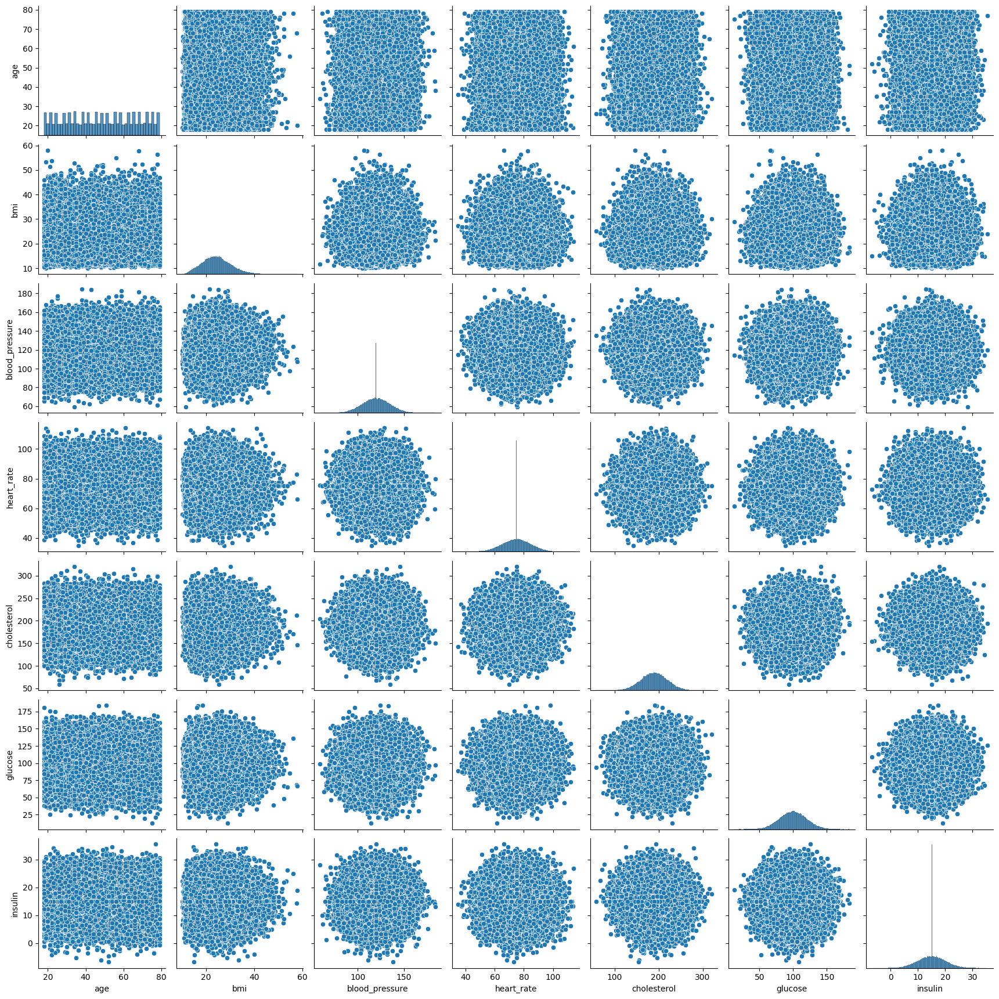

In [15]:
sns.pairplot(X_train[numerical_columns])

Сбор всех выбросов во всех колонках и их удаление

In [16]:
import numpy as np
out = set()

bounds = sigma_bounds(X_train, numerical_columns, k=3.0)
out = outlier_indices_by_bounds(X_train, bounds)

df = df.drop(index=list(out))
X_train = X_train.drop(index=list(out))
y_train = y_train.loc[X_train.index]

print(len(X_train) == len(y_train))

True


Повторный просмотр корреляции

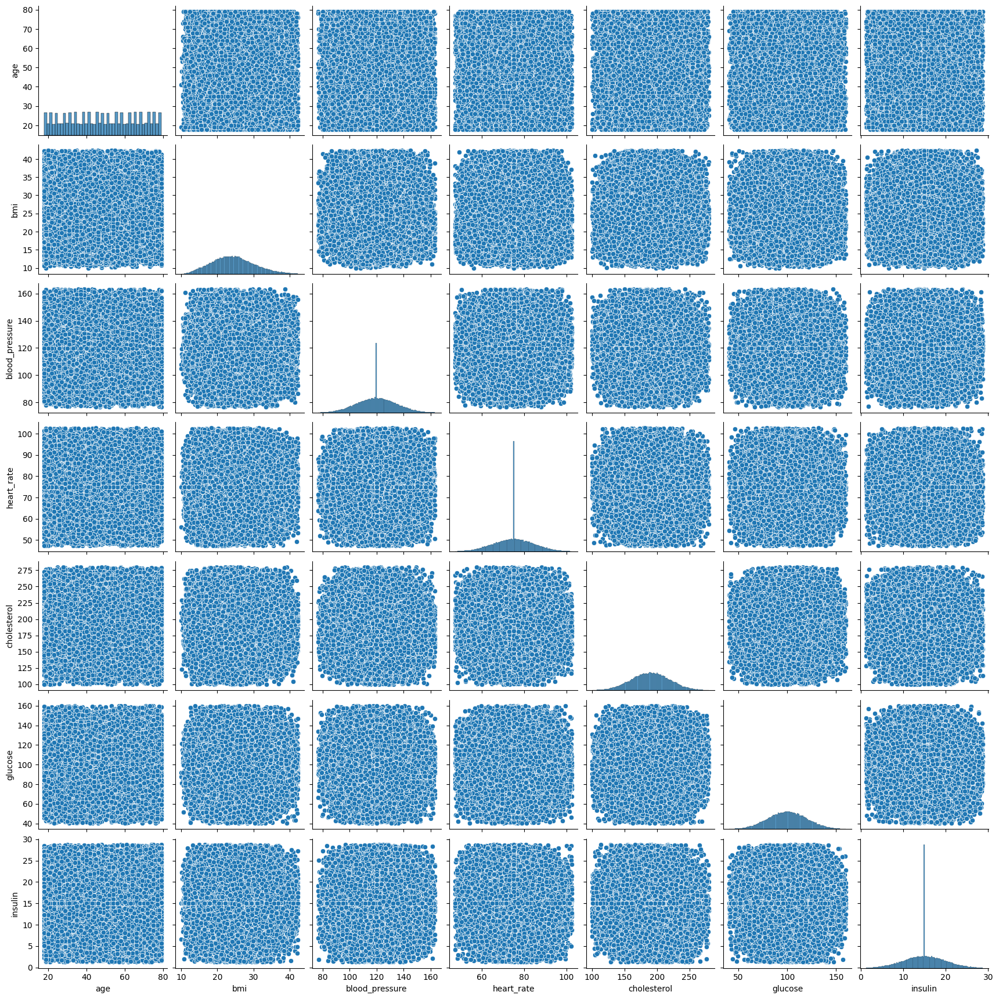

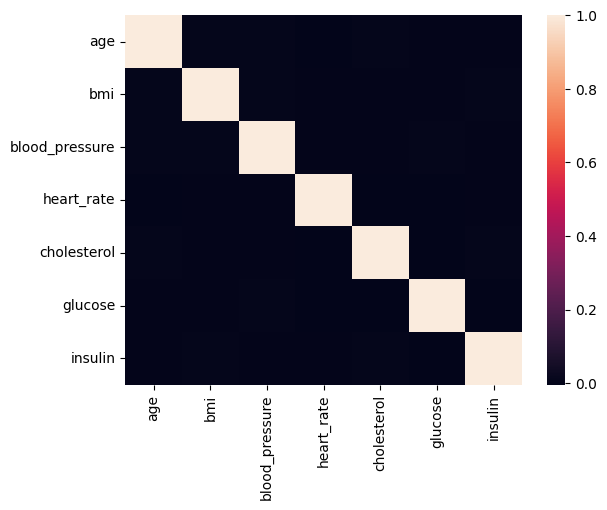

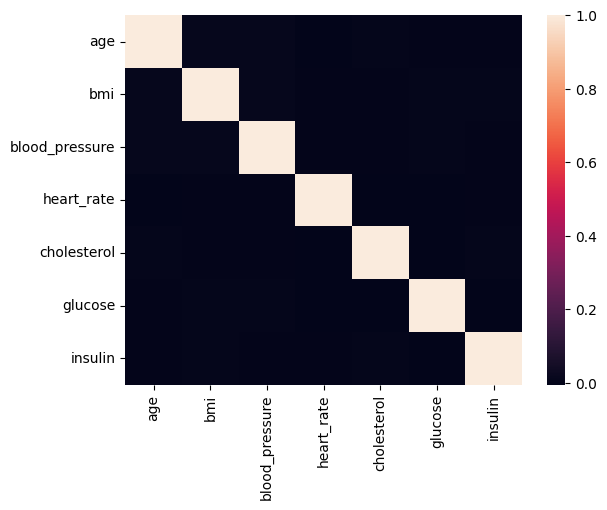

In [17]:
sns.pairplot(X_train[numerical_columns]); plt.show()
sns.heatmap(X_train[numerical_columns].corr(method='spearman')); plt.show()
sns.heatmap(X_train[numerical_columns].corr(method='pearson')); plt.show()

В данных почти нет сильных линейных связей между признаками. Вне диагонали почти всё близко к нулю

Применим полученный результат выбросов и на тестовые данные

In [18]:
for col, (lower, upper) in bounds.items():
    if col in X_test.columns:
        if X_test[col].dtype == 'int64':
            X_test.loc[:, col] = (
                X_test[col]
                .clip(lower=int(np.floor(lower)), upper=int(np.ceil(upper)))
                .astype(X_test[col].dtype)
            )
        else:
            X_test.loc[:, col] = X_test[col].clip(lower=lower, upper=upper)

Теперь сделаем диаграмму рассеяния, но для начала посмотрим матрицу корреляций для выявления признаков с наибольшей (пусть и маленькой) взаимосвзяью


Для начала посмотрим корреляцию между числовыми признаками

In [19]:
corr = df[numerical_columns].corr(method='pearson')
corr

,age,bmi,blood_pressure,heart_rate,cholesterol,glucose,insulin
age,1.000000,0.004985,0.003958,-0.005699,0.005410,-0.000501,-0.000428
bmi,0.004985,1.000000,0.001155,0.001900,0.000336,0.003059,0.003656
blood_pressure,0.003958,0.001155,1.000000,-0.000960,0.000976,0.001043,0.002777
heart_rate,-0.005699,0.001900,-0.000960,1.000000,-0.001574,-0.000957,-0.001342
cholesterol,0.005410,0.000336,0.000976,-0.001574,1.000000,-0.002513,0.006081
glucose,-0.000501,0.003059,0.001043,-0.000957,-0.002513,1.000000,-0.002494
insulin,-0.000428,0.003656,0.002777,-0.001342,0.006081,-0.002494,1.000000


Теперь посмотрим корреляцию между целевым признаком и численными признаками

In [20]:
corr_with_y = df[numerical_columns].corrwith(y_bin)
corr_with_y.sort_values(ascending=False)

,0
age,0.006263
bmi,0.002290
insulin,0.001450
cholesterol,0.001193
glucose,0.000853
heart_rate,-0.000516
blood_pressure,-0.002075


Как мы видим сильной взаимосвязи между признаками нет, поэтому немного проанализируем полученное и решим по каким признакам построить диаграмму рассеяности:

Работа с таблицами проводилась в следующей Google-таблице (https://docs.google.com/spreadsheets/d/1FoD9t5EEV2SQCFTW3m40rX29H55DqPsx__TQ-HKVS1s/edit?usp=sharing)

В коллабе будет продублирована работа в чуть упрощенном виде (без форматирования и формул, используемых в гугл таблицах)

In [21]:
import io
pd.read_csv(io.StringIO('''
,age,bmi,blood_pressure,heart_rate,cholesterol,glucose,insulin,sleep_hours,work_hours,daily_steps,calorie_intake,sugar_intake,water_intake,stress_level,meals_per_day,target
age,1.000000,0.005813,0.004073,0.003724,0.003975,0.003360,0.007096,-0.000028,0.008027,0.006774,0.005464,0.000516,0.006250,0.001445,-0.002469,-0.004273
bmi,0.005813,1.000000,0.001597,0.002725,-0.002661,-0.006623,0.001626,0.005992,0.000517,-0.001132,0.007845,0.006033,-0.001030,0.004516,-0.004160,-0.002259
blood_pressure,0.004073,0.001597,1.000000,-0.004422,0.003761,0.000324,0.008213,0.011707,0.000379,-0.005427,0.003217,-0.014570,-0.004899,0.005546,0.004311,0.003943
heart_rate,0.003724,0.002725,-0.004422,1.000000,-0.004179,-0.004668,0.005576,-0.003813,-0.005878,-0.005139,0.012429,0.004530,-0.002552,0.004429,0.005565,0.000755
cholesterol,0.003975,-0.002661,0.003761,-0.004179,1.000000,-0.007027,0.020514,-0.000885,-0.000121,-0.005513,-0.000700,-0.000732,-0.003526,0.001546,-0.002427,-0.004061
glucose,0.003360,-0.006623,0.000324,-0.004668,-0.007027,1.000000,-0.009471,-0.012819,-0.009000,-0.006140,-0.006927,0.008066,0.000842,-0.001294,-0.000520,-0.002524
insulin,0.007096,0.001626,0.008213,0.005576,0.020514,-0.009471,1.000000,-0.002588,-0.000668,-0.011813,0.003446,-0.002923,0.011518,-0.005206,-0.003807,0.002462
sleep_hours,-0.000028,0.005992,0.011707,-0.003813,-0.000885,-0.012819,-0.002588,1.000000,0.000975,-0.004664,0.004178,0.000853,0.014802,-0.011555,0.005172,-0.004086
work_hours,0.008027,0.000517,0.000379,-0.005878,-0.000121,-0.009000,-0.000668,0.000975,1.000000,-0.002030,-0.005692,0.005755,-0.001761,-0.006277,-0.007300,0.014562
daily_steps,0.006774,-0.001132,-0.005427,-0.005139,-0.005513,-0.006140,-0.011813,-0.004664,-0.002030,1.000000,-0.000359,0.003750,0.007756,0.004492,-0.002344,0.007677
calorie_intake,0.005464,0.007845,0.003217,0.012429,-0.000700,-0.006927,0.003446,0.004178,-0.005692,-0.000359,1.000000,0.010607,-0.009491,-0.002603,-0.008066,0.003517
sugar_intake,0.000516,0.006033,-0.014570,0.004530,-0.000732,0.008066,-0.002923,0.000853,0.005755,0.003750,0.010607,1.000000,-0.001101,0.004832,-0.000124,0.003103
water_intake,0.006250,-0.001030,-0.004899,-0.002552,-0.003526,0.000842,0.011518,0.014802,-0.001761,0.007756,-0.009491,-0.001101,1.000000,0.005128,-0.007000,0.000559
stress_level,0.001445,0.004516,0.005546,0.004429,0.001546,-0.001294,-0.005206,-0.011555,-0.006277,0.004492,-0.002603,0.004832,0.005128,1.000000,-0.002149,-0.002207
meals_per_day,-0.002469,-0.004160,0.004311,0.005565,-0.002427,-0.000520,-0.003807,0.005172,-0.007300,-0.002344,-0.008066,-0.000124,-0.007000,-0.002149,1.000000,0.009275
'''), header=None)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,NaN,age,bmi,blood_pressure,heart_rate,cholesterol,glucose,insulin,sleep_hours,work_hours,daily_steps,calorie_intake,sugar_intake,water_intake,stress_level,meals_per_day,target
1,age,1.000000,0.005813,0.004073,0.003724,0.003975,0.003360,0.007096,-0.000028,0.008027,0.006774,0.005464,0.000516,0.006250,0.001445,-0.002469,-0.004273
2,bmi,0.005813,1.000000,0.001597,0.002725,-0.002661,-0.006623,0.001626,0.005992,0.000517,-0.001132,0.007845,0.006033,-0.001030,0.004516,-0.004160,-0.002259
3,blood_pressure,0.004073,0.001597,1.000000,-0.004422,0.003761,0.000324,0.008213,0.011707,0.000379,-0.005427,0.003217,-0.014570,-0.004899,0.005546,0.004311,0.003943
4,heart_rate,0.003724,0.002725,-0.004422,1.000000,-0.004179,-0.004668,0.005576,-0.003813,-0.005878,-0.005139,0.012429,0.004530,-0.002552,0.004429,0.005565,0.000755
5,cholesterol,0.003975,-0.002661,0.003761,-0.004179,1.000000,-0.007027,0.020514,-0.000885,-0.000121,-0.005513,-0.000700,-0.000732,-0.003526,0.001546,-0.002427,-0.004061
6,glucose,0.003360,-0.006623,0.000324,-0.004668,-0.007027,1.000000,-0.009471,-0.012819,-0.009000,-0.006140,-0.006927,0.008066,0.000842,-0.001294,-0.000520,-0.002524
7,insulin,0.007096,0.001626,0.008213,0.005576,0.020514,-0.009471,1.000000,-0.002588,-0.000668,-0.011813,0.003446,-0.002923,0.011518,-0.005206,-0.003807,0.002462
8,sleep_hours,-0.000028,0.005992,0.011707,-0.003813,-0.000885,-0.012819,-0.002588,1.000000,0.000975,-0.004664,0.004178,0.000853,0.014802,-0.011555,0.005172,-0.004086
9,work_hours,0.008027,0.000517,0.000379,-0.005878,-0.000121,-0.009000,-0.000668,0.000975,1.000000,-0.002030,-0.005692,0.005755,-0.001761,-0.006277,-0.007300,0.014562


Макс. значение прямой взаимосвязи = 0,0205140

Макс. значение обратной взаимосвязи = -0,0145700

Уберем все ячейки со значением по модулю меньшие чем 0,01

In [22]:
import io
pd.read_csv(io.StringIO('''
,age,bmi,blood_pressure,heart_rate,cholesterol,glucose,insulin,sleep_hours,work_hours,daily_steps,calorie_intake,sugar_intake,water_intake,stress_level,meals_per_day,target
age,,,,,,,,,,,,,,,,
bmi,,,,,,,,,,,,,,,,
blood_pressure,,,,,,,,"0,0117070",,,,"-0,0145700",,,,
heart_rate,,,,,,,,,,,"0,0124290",,,,,
cholesterol,,,,,,,"0,0205140",,,,,,,,,
glucose,,,,,,,,"-0,0128190",,,,,,,,
insulin,,,,,"0,0205140",,,,,"-0,0118130",,,"0,0115180",,,
sleep_hours,,,"0,0117070",,,"-0,0128190",,,,,,,"0,0148020","-0,0115550",,
work_hours,,,,,,,,,,,,,,,,"0,0145620"
daily_steps,,,,,,,"-0,0118130",,,,,,,,,
calorie_intake,,,,"0,0124290",,,,,,,,"0,0106070",,,,
sugar_intake,,,"-0,0145700",,,,,,,,"0,0106070",,,,,
water_intake,,,,,,,"0,0115180","0,0148020",,,,,,,,
stress_level,,,,,,,,"-0,0115550",,,,,,,,
meals_per_day,,,,,,,,,,,,,,,,
'''), header=None)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,NaN,age,bmi,blood_pressure,heart_rate,cholesterol,glucose,insulin,sleep_hours,work_hours,daily_steps,calorie_intake,sugar_intake,water_intake,stress_level,meals_per_day,target
1,age,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,bmi,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,blood_pressure,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"0,0117070",NaN,NaN,NaN,"-0,0145700",NaN,NaN,NaN,NaN
4,heart_rate,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"0,0124290",NaN,NaN,NaN,NaN,NaN
5,cholesterol,NaN,NaN,NaN,NaN,NaN,NaN,"0,0205140",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,glucose,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"-0,0128190",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,insulin,NaN,NaN,NaN,NaN,"0,0205140",NaN,NaN,NaN,NaN,"-0,0118130",NaN,NaN,"0,0115180",NaN,NaN,NaN
8,sleep_hours,NaN,NaN,"0,0117070",NaN,NaN,"-0,0128190",NaN,NaN,NaN,NaN,NaN,NaN,"0,0148020","-0,0115550",NaN,NaN
9,work_hours,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"0,0145620"


Уберем одно из дублирующих значений (т.е. sleep hours / blood presure или blood presure / sleep hours), т.е. все что ниже/выше диагонали, кроме столбца target

In [23]:
import io
pd.read_csv(io.StringIO('''
,age,bmi,blood_pressure,heart_rate,cholesterol,glucose,insulin,sleep_hours,work_hours,daily_steps,calorie_intake,sugar_intake,water_intake,stress_level,meals_per_day,target
age,,,,,,,,,,,,,,,,
bmi,,,,,,,,,,,,,,,,
blood_pressure,,,,,,,,,,,,,,,,
heart_rate,,,,,,,,,,,,,,,,
cholesterol,,,,,,,,,,,,,,,,
glucose,,,,,,,,,,,,,,,,
insulin,,,,,"0,0205140",,,,,,,,,,,
sleep_hours,,,"0,0117070",,,"-0,0128190",,,,,,,,,,
work_hours,,,,,,,,,,,,,,,,"0,0145620"
daily_steps,,,,,,,"-0,0118130",,,,,,,,,
calorie_intake,,,,"0,0124290",,,,,,,,,,,,
sugar_intake,,,"-0,0145700",,,,,,,,"0,0106070",,,,,
water_intake,,,,,,,"0,0115180","0,0148020",,,,,,,,
stress_level,,,,,,,,"-0,0115550",,,,,,,,
meals_per_day,,,,,,,,,,,,,,,,
'''), header=None)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,NaN,age,bmi,blood_pressure,heart_rate,cholesterol,glucose,insulin,sleep_hours,work_hours,daily_steps,calorie_intake,sugar_intake,water_intake,stress_level,meals_per_day,target
1,age,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,bmi,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,blood_pressure,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,heart_rate,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,cholesterol,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,glucose,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,insulin,NaN,NaN,NaN,NaN,"0,0205140",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,sleep_hours,NaN,NaN,"0,0117070",NaN,NaN,"-0,0128190",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,work_hours,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"0,0145620"


В качестве признаков для построения диаграммы рассеяности выберем
- insulin / cholesterol
- sleep hours / blood pressure
- calorie intake / heart rate
- sugar intake / calorie intake

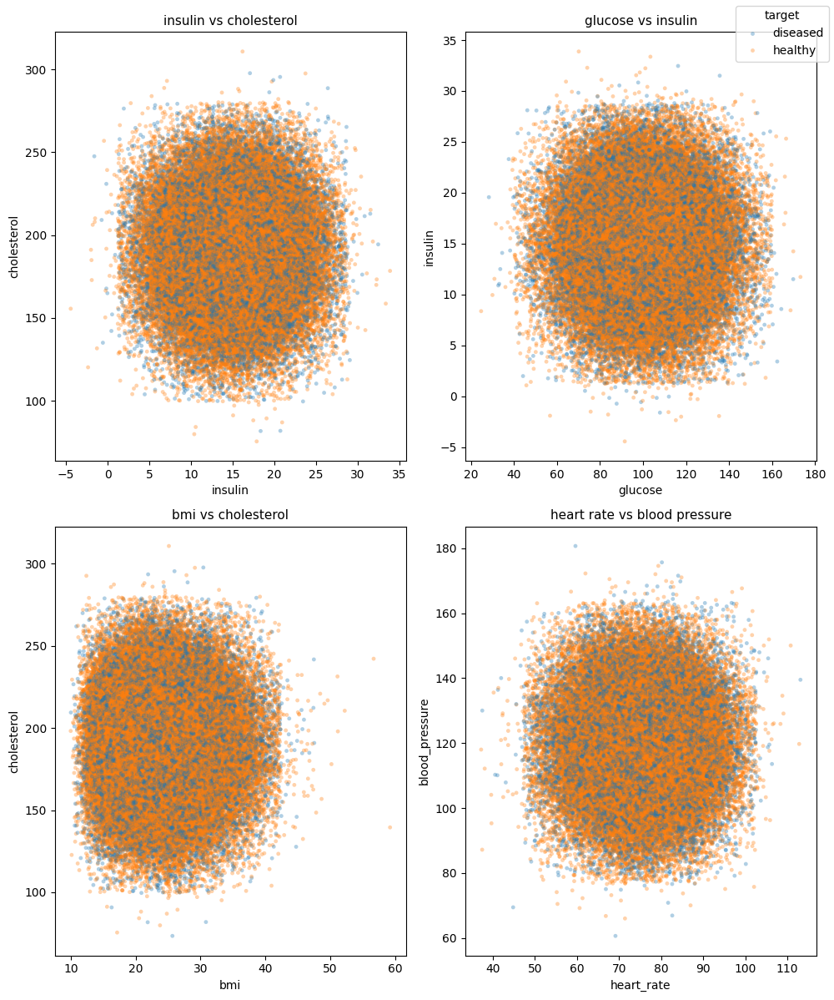

In [24]:
pairs = [
    ('insulin', 'cholesterol', 'insulin vs cholesterol'),
    ('glucose', 'insulin', 'glucose vs insulin'),
    ('bmi', 'cholesterol', 'bmi vs cholesterol'),
    ('heart_rate', 'blood_pressure', 'heart rate vs blood pressure'),
]

palette = {'diseased': 'C0', 'healthy': 'C1'}

fig, axes = plt.subplots(2, 2, figsize=(10, 12))
axes = axes.ravel()

for i, (x, y, title) in enumerate(pairs):
    ax = axes[i]
    g = sns.scatterplot(
        data=df, x=x, y=y,
        hue='target', hue_order=['diseased', 'healthy'],
        palette=palette, s=12, alpha=0.35, linewidth=0,
        ax=ax, legend=('full' if i == 0 else False)
    )
    if i == 0:
        handles, labels = g.get_legend_handles_labels()
        g.legend_.remove()

    ax.set_title(title, fontsize=11)
    ax.set_xlabel(x); ax.set_ylabel(y)

if handles:
    fig.legend(handles[0:], labels[0:], title='target',
               loc='upper right', frameon=True)

plt.tight_layout()
plt.show()

На диаграммах рассеяния не просматривается выраженных трендов - ни линейных, ни нелинейных. Зависимости выглядят слабыми и статистически неубедительными. Как итог сильной взаимосвязи между выбранными парами признаков не обнаружено

Построим ящик с усами для целевого признака, уровня стресса и количества часов сна

In [25]:
import plotly.graph_objects as go

colors = {'healthy': '#1f77b4', 'diseased': '#d62728'}
names  = {'healthy': 'Здоров',   'diseased': 'Болен'}

df_plot = df.loc[df['heart_rate'].notna() & df['blood_pressure'].notna()].copy()

lo = int(np.floor(df_plot['heart_rate'].min() / 10) * 10)
hi = int(np.ceil (df_plot['heart_rate'].max() / 10) * 10)
bins = np.arange(lo, hi + 10, 10)
labels = [f'{b}-{b+9}' for b in bins[:-1]]

df_plot['hr_bin'] = pd.cut(df_plot['heart_rate'], bins=bins, labels=labels, right=False)

fig = go.Figure()
for cls, off in [('healthy', 'h'), ('diseased', 'd')]:
    m = df_plot['target'].eq(cls) & df_plot['hr_bin'].notna()
    fig.add_trace(go.Box(
        x=df_plot.loc[m, 'hr_bin'].astype(str),
        y=df_plot.loc[m, 'blood_pressure'],
        name=names[cls],
        marker_color=colors[cls],
        boxpoints='outliers',
        boxmean=True,
        opacity=0.85,
        offsetgroup=off,
        alignmentgroup='all',
    ))

fig.update_layout(
    xaxis_title='heart_rate (уд/мин, бины)',
    yaxis_title='blood_pressure',
    boxmode='group',
    template='plotly_white',
    height=520, width=950
)
fig.update_xaxes(categoryorder='array', categoryarray=labels)
fig.show()


Больные в среднем спят немного меньше, стресс слегка укорачивает сон, однако сильной взаимосвязи на основе полученных данных не было обнаружено

Построим гистограммы для целевого признака и
- stress level
- sleep hours
- work hours

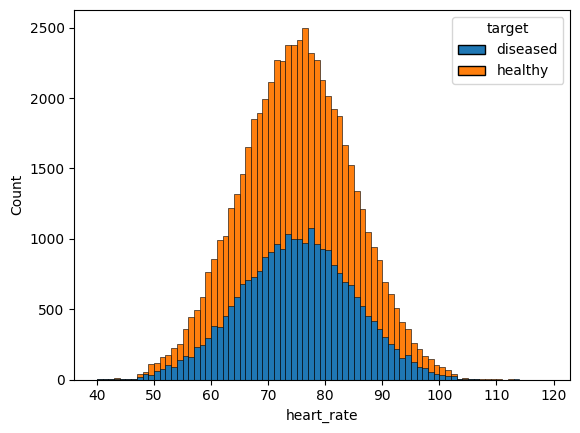

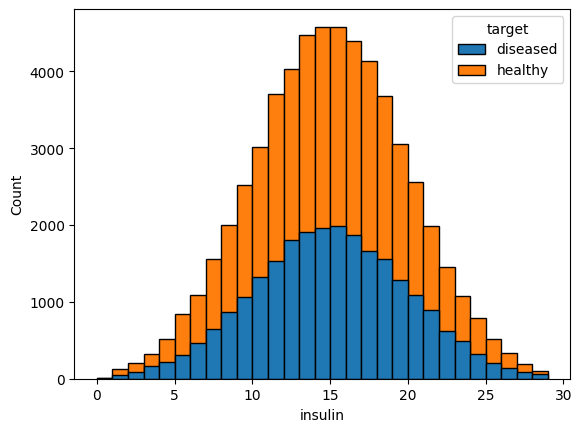

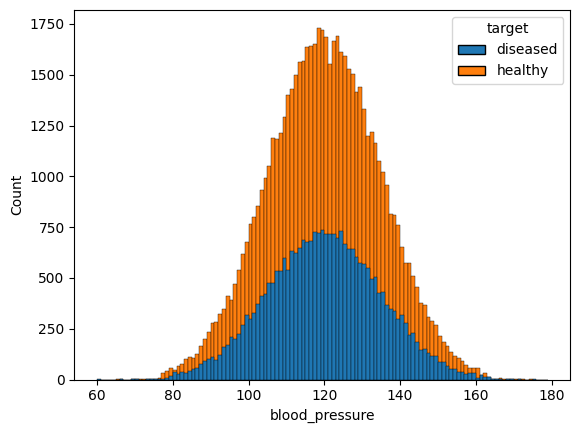

In [26]:
sns.histplot(
    data=df, x='heart_rate', hue='target', hue_order=['diseased','healthy'],
    multiple='layer', stat='count', bins=range(40, 120), common_bins=True, alpha=1
)
plt.show()

sns.histplot(
    data=df, x='insulin', hue='target', hue_order=['diseased','healthy'],
    multiple='layer', stat='count', bins=range(0, 30), common_bins=True, alpha=1
)
plt.show()

sns.histplot(
    data=df, x='blood_pressure', hue='target', hue_order=['diseased','healthy'],
    multiple='layer', stat='count', bins=range(60, 180), common_bins=True, alpha=1
)
plt.show()


На этих признаках никакой сильной связи с целевым признаком нет. Некоторые наблюдения возможны для sleep_hours, но это слишком незначиельно

Нормализуем численные признаки

In [27]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train[numerical_columns] = scaler.fit_transform(X_train[numerical_columns])

Проверим это

In [28]:
X_train[numerical_columns].head()

,age,bmi,blood_pressure,heart_rate,cholesterol,glucose,insulin
4410,0.426230,0.653972,0.476549,0.433378,0.665615,0.134596,0.268227
44776,0.426230,0.587317,0.550540,0.384826,0.276684,0.617919,0.655187
73397,0.344262,0.518312,0.419743,0.374568,0.721169,0.319295,0.455879
2529,0.114754,0.783188,0.497502,0.430755,0.493969,0.276742,0.465244
66304,0.442623,0.373856,0.440426,0.501161,0.535354,0.482945,0.499739


Перейдем к преобразованию категориальных признаков в численные при помощи OneHot энкодера

In [29]:
from sklearn.preprocessing import OneHotEncoder

ohe = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
ohe.fit(X_train[categorical_columns])
ohe_columns = ohe.get_feature_names_out(categorical_columns)

X_train_categorical = pd.DataFrame(
    ohe.transform(X_train[categorical_columns]),
    columns=ohe.get_feature_names_out(categorical_columns),
    index=X_train.index
)
X_test_categorical = pd.DataFrame(
    ohe.transform(X_test[categorical_columns]),
    columns=ohe.get_feature_names_out(categorical_columns),
    index=X_test.index
)

X_train = pd.concat([X_train[numerical_columns], X_train_categorical], axis=1)
X_test = pd.concat([X_test[numerical_columns], X_test_categorical], axis=1)

Проверим это

In [30]:
X_train[ohe_columns].head()

,gender_Female,gender_Male
4410,0.0,1.0
44776,1.0,0.0
73397,1.0,0.0
2529,1.0,0.0
66304,1.0,0.0


In [31]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 78257 entries, 4410 to 84570
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             78257 non-null  float64
 1   bmi             78257 non-null  float64
 2   blood_pressure  78257 non-null  float64
 3   heart_rate      78257 non-null  float64
 4   cholesterol     78257 non-null  float64
 5   glucose         78257 non-null  float64
 6   insulin         78257 non-null  float64
 7   gender_Female   78257 non-null  float64
 8   gender_Male     78257 non-null  float64
dtypes: float64(9)
memory usage: 6.0 MB


Всё верно сделано. Отметим, что после всех операций осталось всего ~20000 записей

Теперь воспользуемся статистически функциями, представленными `scipy.stats`

Проверим основную математическо-статистическую информацию о каждом признаке (Данные нормализованы при помощи MinMaxScaler):
- Минимальное значение
- Максимальное значение
- Среднее значение
- Дисперсия
- Ассиметрию распределения
- Эксцесс

In [32]:
import scipy.stats as st

for col in X_train.columns:
  print(col)
  print(st.describe(X_train[col]))
  print("\n")

age
DescribeResult(nobs=np.int64(78257), minmax=(np.float64(0.0), np.float64(1.0)), mean=np.float64(0.5008281875795116), variance=np.float64(0.08612606515598456), skewness=np.float64(-0.0016214790145630046), kurtosis=np.float64(-1.2028058623690376))


bmi
DescribeResult(nobs=np.int64(78257), minmax=(np.float64(0.0), np.float64(1.0)), mean=np.float64(0.4454885585128791), variance=np.float64(0.03217818398034546), skewness=np.float64(0.2929626843055484), kurtosis=np.float64(-0.21696504530989857))


blood_pressure
DescribeResult(nobs=np.int64(78257), minmax=(np.float64(0.0), np.float64(1.0)), mean=np.float64(0.500082785819349), variance=np.float64(0.026904265225475874), skewness=np.float64(-0.003488793376310959), kurtosis=np.float64(0.019805498293685275))


heart_rate
DescribeResult(nobs=np.int64(78257), minmax=(np.float64(0.0), np.float64(1.0)), mean=np.float64(0.5001192130365286), variance=np.float64(0.026570236924978223), skewness=np.float64(-0.023445644712088064), kurtosis=np.float64(0

Проверим насколько исходные данные соответствуют нормальному распределению. Проверим данные, используемые при обучении модели, но из исходного датасета, чтобы избежать влияния MinMaxScaler и удаления выбросов.

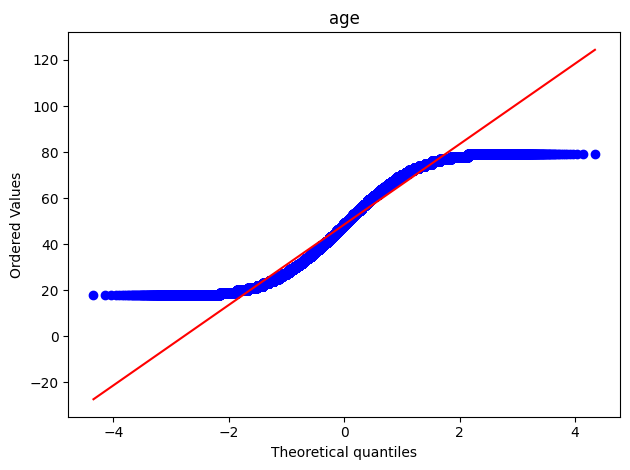

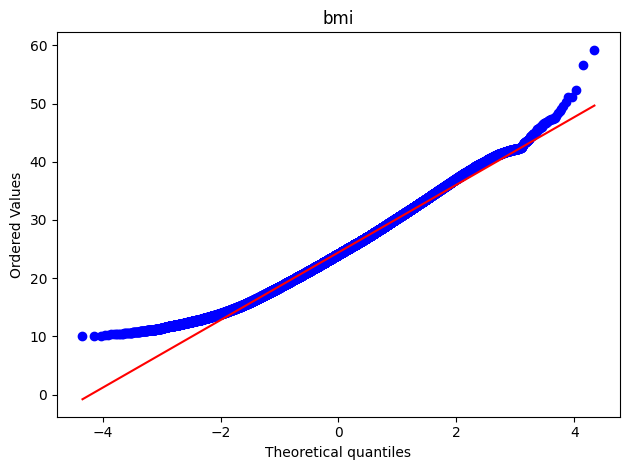

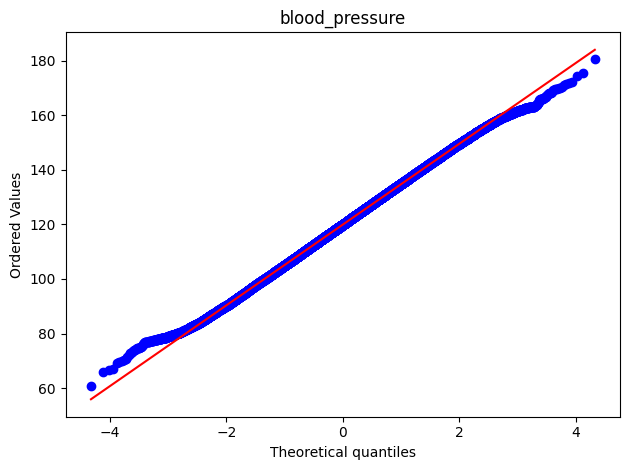

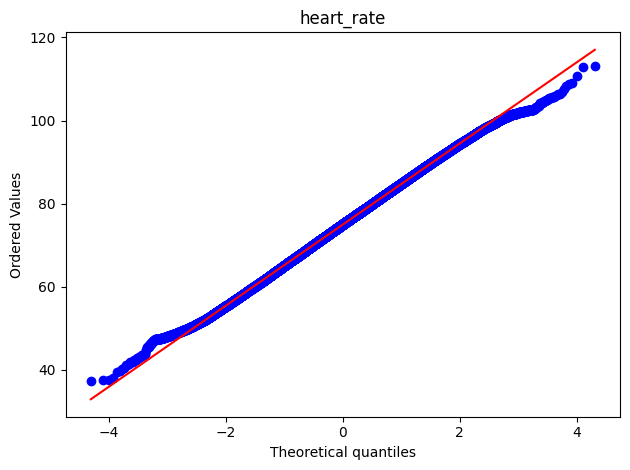

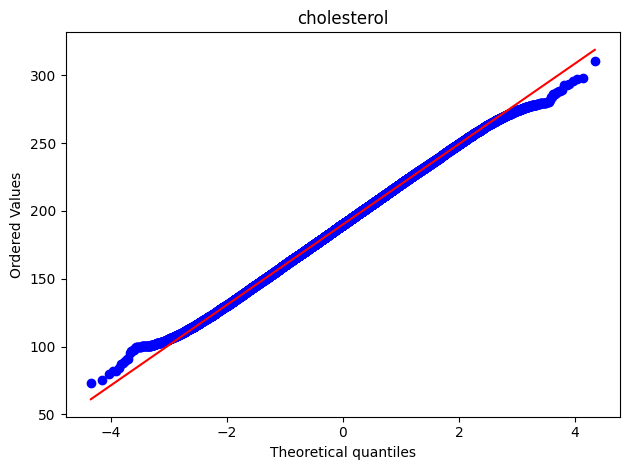

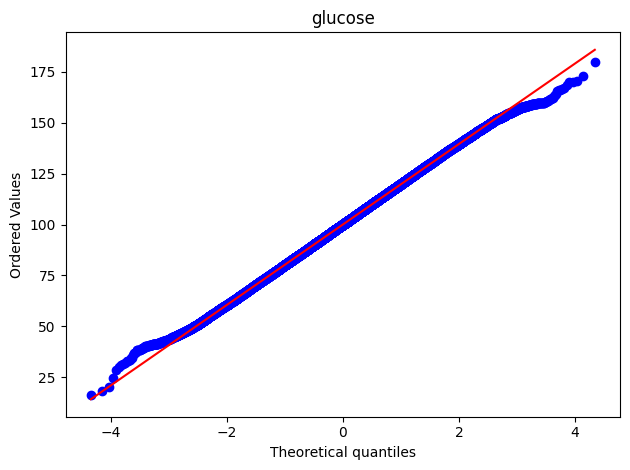

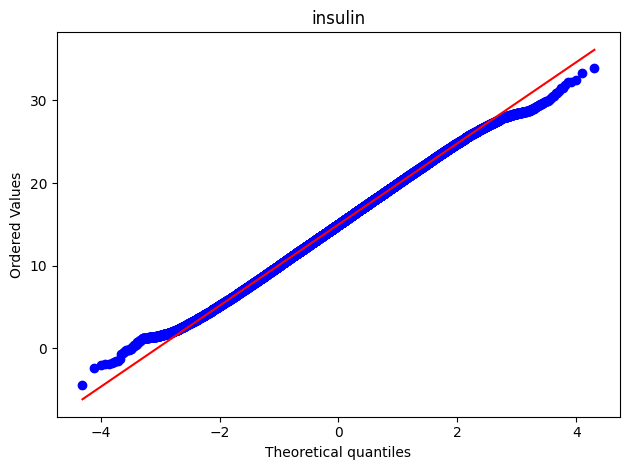

In [33]:
for col in numerical_columns:
  st.probplot(df[col].dropna(), dist='norm', plot=plt)
  plt.title(f"{col}")
  plt.tight_layout()
  plt.show()

Почти все признаки, за исключением возраста, распределены схоже с нормальным распределением

Итак, все задания первой лабораторной работы выполнены:
- [x] Очистка данных (удаление пропусков, нормализация, удаление дубликатов)
- Визуализация значимых признаков:
  - [x] диаграммы рассеяния
  - [x] ящики с усами
  - [x] гистограммы
- [x] Корреляция данных (матрица корреляций)
- [x] Использование статистических функций

# Лабораторая работа №2

В данной лабораторной работе используем 3 метода обучения модели:
- k-nn (Метод ближайший соседей)
- SVM (Метод опорных векторов)
- Random Forest (Случайный лес)

Оценивать разные модели будем при помощи таких метрик как:
- Persicion
- Recall
- F1 Score
- ROC AUC

Ещё до обучения модели существует вероятность плохой обучаемости в виду факта, что при попытке поиска корреляций данных никакой сильной зависимоти обнаружено не было. Также есть предположение что среди трех методов хуже всего сработает k-nn ввиду большого количества признаков => многомерное пространство

Сделаем некоторые шаги - общие для всех методов

In [34]:
from sklearn.impute import SimpleImputer
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, make_scorer, ConfusionMatrixDisplay, auc
from sklearn.metrics import f1_score, precision_score, recall_score, roc_curve, roc_auc_score, confusion_matrix, classification_report, accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, StratifiedKFold

In [35]:
y_train_bin = (y_train == 'diseased').astype(int)
y_test_bin = (y_test == 'diseased').astype(int)

### K-nn

Попробуем обучить модель методом k ближайших соседей

Заполним пропущенные значения в тестовых данных

In [ ]:
imputer = SimpleImputer(strategy='median')
X_train_knn = imputer.fit_transform(X_train)
X_test_knn = imputer.transform(X_test)

В этой части кода мы делаем подбор оптимального количества соседей (k) для алгоритма k-NN с целью максимизации F1-score для класса "болен" (метка 1)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

neighbors = range(1, 31)    # перебираем k от 1 до 30
best_f1_1 = 0               # лучшее значение F1-score
best_k = 1                  # Лучшее значение k

# Запускаем цикл перебора значений к
for k in neighbors:
    # Создаем модель с текущим к. Веса точек распределяются обратно пропорционально их расстоянию с помощью weights='distance'.
    knn = KNeighborsClassifier(n_neighbors=k, weights='distance')
    # обучаем модель на тренировочных данных
    knn.fit(X_train_knn, y_train)
    # здесь мы делаем предсказание на тестовых данных
    y_pred = knn.predict(X_test_knn)

    # Вычисляем F1-score для класса 1 ("болен")
    f1_1 = f1_score(y_test, y_pred, pos_label='diseased')

    # прописываем условие для поиска лучшего k
    if f1_1 > best_f1_1:
        best_f1_1 = f1_1
        best_k = k

Производится финальная версия модели

In [ ]:
knn = KNeighborsClassifier(n_neighbors=7, weights='uniform')
knn.fit(X_train_knn, y_train)
knn.score(X_test_knn,y_test)


0.69955

Получим предсказание от модели и создадим матрицу ошибок

Как читать матрицу:

- По диагонали (0,0 и 1,1): Правильные предсказания

- Вне диагонали: Ошибки модели

- True Positive (1,1): Правильно предсказанные "больные"

- True Negative (0,0): Правильно предсказанные "здоровые"

- False Positive (0,1): Ложноположительные (здоровые, но предсказаны как больные)

- False Negative (1,0): Ложноотрицательные (больные, но предсказаны как здоровые)

In [ ]:
y_pred = knn.predict(X_test_knn)

pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)

Predicted,diseased,healthy,All
True,,,
diseased,17,5964,5981
healthy,45,13974,14019
All,62,19938,20000


Создаем расширенную версию матрицы ошибок с дополнительными метриками.

Для каждого класса (0 и 1) выводит:

- Precision (Точность) - из всех предсказанных классом X, сколько действительно X

- Recall (Полнота) - из всех реальных X, сколько правильно предсказано

- F1-score - гармоническое среднее между Precision и Recall

- Support - количество образцов в каждом классе

In [ ]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

    diseased       0.27      0.00      0.01      5981
     healthy       0.70      1.00      0.82     14019

    accuracy                           0.70     20000
   macro avg       0.49      0.50      0.41     20000
weighted avg       0.57      0.70      0.58     20000



Построим ROC кривую

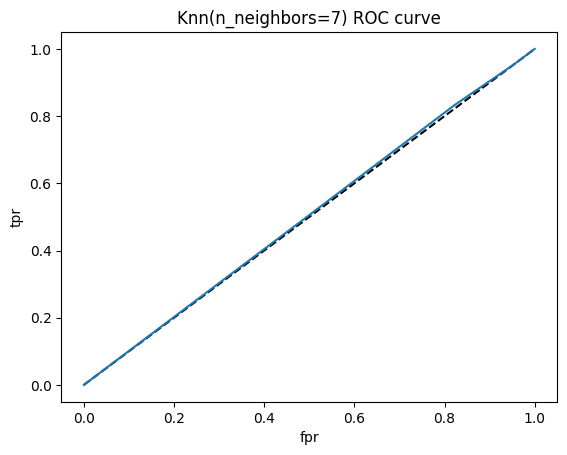

np.float64(0.4953167077250679)

In [ ]:
y_pred_proba = knn.predict_proba(X_test_knn)[:,1]
fpr, tpr, thresholds = roc_curve(y_test_bin, y_pred_proba)

plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='Knn')
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.title('Knn(n_neighbors=7) ROC curve')
plt.show()
roc_auc_score(y_test,y_pred_proba)

### SVM

Попробуем обучить модель методом опорных векторов

In [ ]:
from sklearn.svm import SVC

Кросс-валидация для надежной оценки

In [ ]:
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
f1_scores = []
recall_scores = []
precision_scores = []
all_reports = []

Создаем пайплайн для избежания утечки данных

In [ ]:
pipeline = Pipeline([
    ('imp', SimpleImputer(strategy='median')),
    ('svm', SVC(class_weight='balanced', random_state=42, probability=True))
])

Зададим сетку гиперпараметров

In [ ]:
# param_grid = {
#     'svm__kernel': ['linear'],
#     'svm__C': [2.0, 2.5, 3.0],
#     'svm__gamma': ['scale']
# }

param_grid = {
    'svm__kernel': ['linear'],
    'svm__C': [2.5],
    'svm__gamma': ['scale']
}

Обучим модель и получим лучшие параметры

In [ ]:
grid_search = GridSearchCV(
    pipeline,
    param_grid,
    cv=cv,
    scoring='roc_auc',
    n_jobs=-1,
    verbose=1
)

grid_search.fit(X_train, y_train)
print('CV ROC AUC:', grid_search.best_score_, '\nBest:', grid_search.best_params_)
best_model_svm = grid_search.best_estimator_

Fitting 3 folds for each of 1 candidates, totalling 3 fits
CV ROC AUC: 0.5057216952371989 
Best: {'svm__C': 2.5, 'svm__gamma': 'scale', 'svm__kernel': 'linear'}


Проверим на тестовых данных

In [ ]:
proba_pos_svm = best_model_svm.predict_proba(X_test)[:, 1]

Посмотрим на метрики оценки модели при пороге классификации в 0,7

In [ ]:
y_pred_svm = (proba_pos_svm >= 0.7).astype(int)

Построим и посмотрим на матрицу ошибок

In [ ]:
cm_10_svm = confusion_matrix(y_test_bin, y_pred_svm, labels=[1, 0])
cm_df_svm = pd.DataFrame(cm_10_svm, index=['True 1', 'True 0'], columns=['Pred 1', 'Pred 0'])
print("Confusion matrix (True: 1/0, Pred: 1/0):\n", cm_df_svm)

Confusion matrix (True: 1/0, Pred: 1/0):
         Pred 1  Pred 0
True 1    3104    2877
True 0    6852    7167


Посмотрим accuracy модели

In [ ]:
acc_svm = accuracy_score(y_test_bin, y_pred_svm)
print(f"\nAccuracy: {acc_svm:.4f}")


Accuracy: 0.5135


In [ ]:
precision_svm = precision_score(y_test_bin, y_pred_svm, pos_label=1, zero_division=0)
recall_svm = recall_score(y_test_bin, y_pred_svm, pos_label=1, zero_division=0)
f1_svm = f1_score(y_test_bin, y_pred_svm, pos_label=1, zero_division=0)
auc_roc_svm = roc_auc_score(y_test_bin, proba_pos_svm)

print(f"\nPrecision: {precision_svm:.4f}")
print(f"Recall: {recall_svm:.4f}")
print(f"F1-score: {f1_svm:.4f}")
print(f"ROC AUC: {auc_roc_svm:.4f}")


Precision: 0.3118
Recall: 0.5190
F1-score: 0.3895
ROC AUC: 0.5183


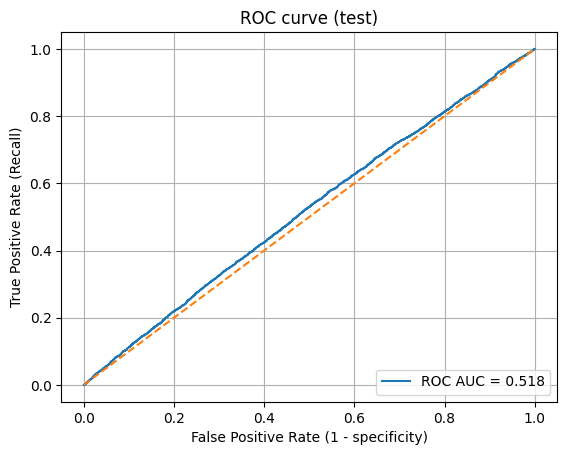

In [ ]:
fpr_svm, tpr_svm, ths_svm = roc_curve(y_test_bin, proba_pos_svm)
plt.figure()
plt.plot(fpr_svm, tpr_svm, label=f'ROC AUC = {auc_roc_svm:.3f}')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate (1 - specificity)')
plt.ylabel('True Positive Rate (Recall)')
plt.title('ROC curve (test)')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

### Random Forest

Попробуем обучить модель методом случайного леса

Импортируем библиотеки

In [36]:
from sklearn.ensemble import RandomForestClassifier
from scipy.stats import randint, uniform

Зададим пайплайн с следующими значениями:
- Если среди численных значений (в том числе тестовых) есть пропуски, то заполним их по медиане столбца
- В качестве метода обучения будет использоваться Random Forest с 300 деревьями, балансировкой весов классов ввиду несбалансированных данных (70% - здоровых, 30% - больных)
- Использовать все ядра CPU
- В качестве сида для вычисления псевдослучайностей выберем 26

In [37]:
pipe = Pipeline([
    ('imp', SimpleImputer(strategy='median')),
    ('rf', RandomForestClassifier(
        n_estimators=300,
        class_weight='balanced_subsample',
        n_jobs=1,
        random_state=26
    ))
])

Зададим сетку гиперпараметров:
- max_depth - максимально доступная глубина дерева
- min_samples_leaf - минимальное количество объектов в листе
- min_samples_split - минимальное количество объектов в узле до деления
- max_features - по какой формуле будет вычисляться количество признаков для узла для его разделения

In [38]:

# grid = {
#     'rf__max_depth': [None, 12],
#     'rf__min_samples_leaf': [1, 2, 4],
#     'rf__min_samples_split': [2, 5, 10],
#     'rf__max_features': ['sqrt', 'log2'],
# }


grid = {
    'rf__max_depth': [12],
    'rf__min_samples_leaf': [4],
    'rf__min_samples_split': [2],
    'rf__max_features': ['sqrt'],
}

Зададим стратифицированную K-fold кросс-валидацию на 3 фолда

In [39]:
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=26)

Преобразуем тренировочные данные целевого признака в бинарные:
- healthy - `0`
- diseased - `1`

In [40]:
y_train_bin = (y_train == 'diseased').astype(int)
y_test_bin = (y_test == 'diseased').astype(int)

Обучим модель и получим значение ROC AUC на валидационных данных

In [41]:
model_with_gs = GridSearchCV(pipe, grid, scoring='roc_auc', cv=cv, n_jobs=1, verbose=1)
model_with_gs.fit(X_train, y_train)
print('CV ROC AUC:', model_with_gs.best_score_, '\nBest:', model_with_gs.best_params_)
best_model_rf = model_with_gs.best_estimator_

Fitting 3 folds for each of 1 candidates, totalling 3 fits
CV ROC AUC: 0.507462582410157 
Best: {'rf__max_depth': 12, 'rf__max_features': 'sqrt', 'rf__min_samples_leaf': 4, 'rf__min_samples_split': 2}


Проверим на тестовых данных

In [42]:
proba_pos_rf = best_model_rf.predict_proba(X_test)[:, 1]

Посмотрим на метрики оценки модели при пороге классификации в 0,65

In [43]:
y_pred_rf = (proba_pos_rf >= 0.65).astype(int)

Построим и посмотрим на матрицу ошибок

In [44]:
cm_10_rf = confusion_matrix(y_test_bin, y_pred_rf, labels=[1, 0])
cm_df_rf = pd.DataFrame(cm_10_rf, index=['True 1', 'True 0'], columns=['Pred 1', 'Pred 0'])
print("Confusion matrix (True: 1/0, Pred: 1/0):\n", cm_df_rf)

Confusion matrix (True: 1/0, Pred: 1/0):
         Pred 1  Pred 0
True 1    5402     579
True 0   12687    1332


Посмотрим accuracy модели

In [45]:
acc_rf = accuracy_score(y_test_bin, y_pred_rf)
print(f"\nAccuracy: {acc_rf:.4f}")


Accuracy: 0.3367


Посчитаем и выведем метрики

In [48]:
precision = precision_score(y_test_bin, y_pred_rf, pos_label=1, zero_division=0)
recall = recall_score(y_test_bin, y_pred_rf, pos_label=1, zero_division=0)
f1 = f1_score(y_test_bin, y_pred_rf, pos_label=1, zero_division=0)
auc_roc = roc_auc_score(y_test_bin, proba_pos_rf)

print(f"\nPrecision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-score: {f1:.4f}")
print(f"ROC AUC: {auc_roc:.4f}")


Precision: 0.2986
Recall: 0.9032
F1-score: 0.4489
ROC AUC: 0.4897


Построим ROC AUC и посмотрим насколько модель хорошо справляется со своей задачей

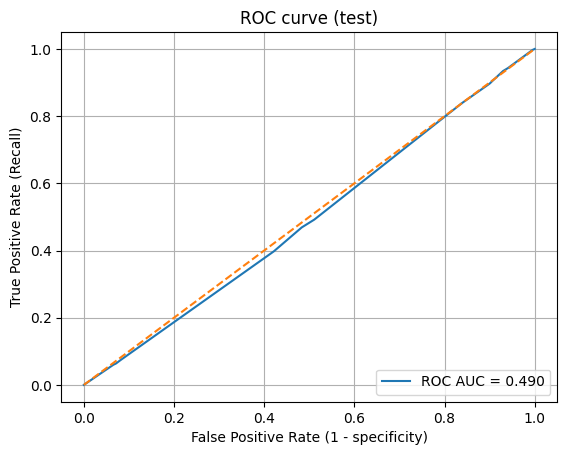

In [50]:
fpr, tpr, ths = roc_curve(y_test_bin, proba_pos_rf)
plt.figure()
plt.plot(fpr, tpr, label=f'ROC AUC = {auc_roc:.3f}')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate (1 - specificity)')
plt.ylabel('True Positive Rate (Recall)')
plt.title('ROC curve (test)')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

Посмотрим на визуализацию Feature Importance для Random Forest

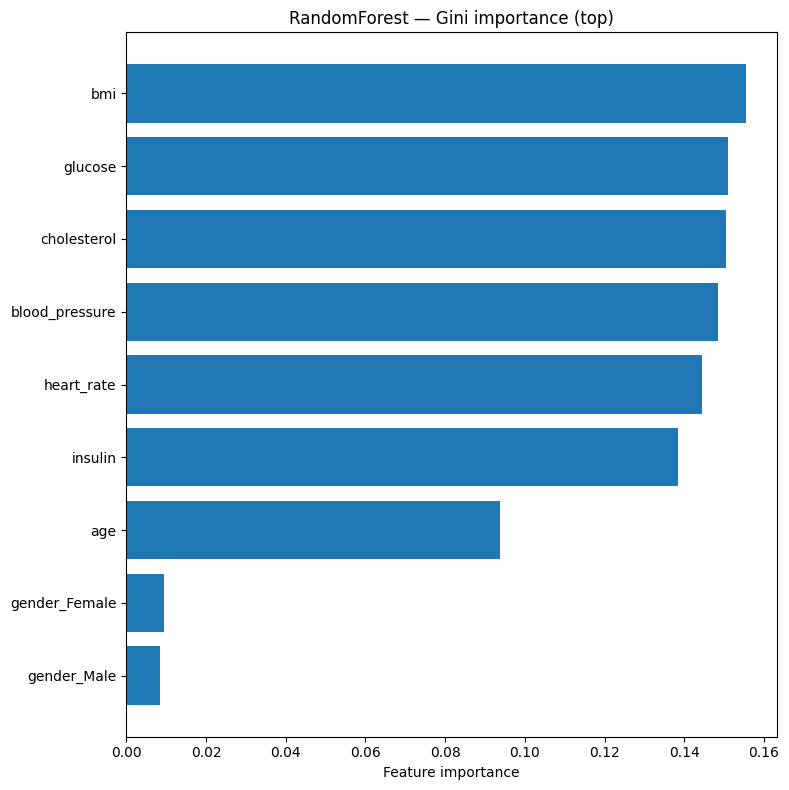

In [53]:
rf = best_model_rf.named_steps.get('rf', best_model_rf)

feat_names = X_train.columns

imp = rf.feature_importances_
idx = np.argsort(imp)[::-1]

top = 10
plt.figure(figsize=(8, 8))
plt.barh(np.array(feat_names)[idx[:top]][::-1], imp[idx[:top]][::-1])
plt.xlabel("Feature importance")
plt.title("RandomForest — Gini importance (top)")
plt.tight_layout()
plt.show()

### Заключение по лабораторной работе №2

Что же как мы видим результат плох, значение ROC AUC примерно равно `0.5` на каждой модели, а значит модели работают словно бросок монеты. Ни обычный результат, ни его инверсированная версия не даст хорошего результата. Еще в первой лабораторной работе мы заметили низкую кореляцию данных как между собой, так и с целевым признаком. Как нам кажется это возможно связано с  вероятным искусственным происхождением данного датасета, поскольку целевой признак достаточно размыт. Ввиду этого получается, что основываясь на выбранных признаках невозможно получить уверенную классификацию объекта. Однако это не означает невозможность выполнения лабораторной работы №3 о кластеризации данных.

*Замечание 30.09.2025*

Были изменены признаки для обучения модели. Поскольку было изложено предположение, что для модели получилось слишком много признаков -> шум, то мы оставили предложенные признаки и полностью убрали те. Конечно правильным вариантом было бы придать тем признакам меньший вес, однако если предположение о зашумлении модели было бы верно, мы бы заметили улучшение метрик. Однако при "правильных" признаках получились всё те же результаты. ROC AUC равен примерно `0.5` при всех методах обучения модели. Предположение о плохом исходном наборе данных и его неественности остаётся приоритетной версией. Что же выйдем в интернет с таким вопросом

https://www.kaggle.com/datasets/mahdimashayekhi/disease-risk-from-daily-habits/code

Есть 8 открытых ноутбуков с данным датасетом. Изучим их:

5 ноутбука сразу не подходят или отсутствия содержательной базы, вычисления не того целевого признака или имеют другой подход к задаче (безуспешная кластеризация)

2 ноутбука, проверяющий много методов машинного обучения и получающий в результате аналогичный в нашей работе результат (ROC AUC = `0.5`)

1 ноутбук, получающий ROC AUC = `1.0`, что звучит неправдоподобно и скорее всего автор допустил ошибки